In [2]:
### Read the datasets which include the text free variable

# coding=utf-8
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

#from mpl_toolkits.basemap import Basemap

In [3]:
import seaborn as sns
#import pandas_profiling

In [4]:
# for WORD CLOUD
from collections import Counter
from nltk.tokenize import RegexpTokenizer
from stop_words import get_stop_words
import nltk
from nltk.corpus import stopwords
from nltk import sent_tokenize, word_tokenize

import re

In [5]:
# installing
from wordcloud import  WordCloud, STOPWORDS

In [6]:
#Perform Sentiment Analysis , installing 

from textblob import TextBlob

In [7]:
## inline = code and visualization right after it
%pylab inline
## parameters for size
pylab.rcParams['figure.figsize'] = (14.0, 12.0)

Populating the interactive namespace from numpy and matplotlib


In [8]:
claritin = pd.read_csv('C:\\Users\\mingming\\Desktop\\python\\ML\\Proposal\\healthdata.csv', 
                   engine='python')
claritin.head(2)

,interaction.id,article_url,content,time,relevant,sentiment,gender,dizziness,convulsions,heart palpitations,shortness of breathe,headaches,drug effect decreased,allergies worse after taking drug,bad interaction between claritin and another drug.,nausea (made the person nauseous),caused insomnia (the person wasn't able to sleep)
0,1e216d4078b8ac80e074b6aefd0b8ecc,http://twitter.com/cm_haynes/statuses/25784942...,Is That Pollen or Profit in the Air? http://t....,"Mon, 15 Oct 2012 14:24:29 +0000",yes,3.0,female,no,no,no,no,no,no,no,no,no,no
1,1e21bdba2f09a600e07449388a202dd0,http://twitter.com/Gladisyrv/statuses/26016897...,Best payment to buy online dovonex no prescrip...,"Mon, 22 Oct 2012 00:01:32 +0000",yes,3.0,female,no,no,no,no,no,no,no,no,no,no


### Test the missing observation for each column


In [9]:
claritin.rename(columns = {'interaction.id':'id', 'drug effect decreased':'drug_effect',
                          'heart palpitations':'heart_palpitations',
                          'allergies worse after taking drug':'allergies_after_drug',
                          'nausea (made the person nauseous)':'nausea',
                          "caused insomnia (the person wasn't able to sleep)":'insomnia',
                          'bad interaction between claritin and another drug.':'bad_interaction_bw',
                          'shortness of breathe': 'shortness_of_breathe'}, inplace = True)

In [10]:
## Exteacting Missing Count and Unique by column
## Creating a dictionary
unique_count = []
for x in claritin.columns:
    unique_count.append([x, len(claritin[x].unique()),claritin[x].isnull().sum()])
    
count_missing = pd.DataFrame(unique_count,columns=["Column","unique","Missing"]).set_index("Column").T   

count_missing

Column,id,article_url,content,time,relevant,sentiment,gender,dizziness,convulsions,heart_palpitations,shortness_of_breathe,headaches,drug_effect,allergies_after_drug,bad_interaction_bw,nausea,insomnia
unique,4900,4900,4786,4884,3,6,5,3,2,3,3,4,3,3,3,3,3
Missing,0,0,0,0,0,237,237,237,237,237,237,237,237,237,237,237,237


In [11]:
# Missing values
print("Missing value:\n{}".format(claritin.isnull().sum().sum()))

# Data Dimensions
print("Dataframe Dimention: {} Rows, {} columns".format(*claritin.shape))

Missing value:
2844
Dataframe Dimention: 4900 Rows, 17 columns


In [12]:
### Estimate the variables informtion

claritin.describe()

,sentiment
count,4663.000000
mean,3.405962
std,0.842169
min,1.000000
25%,3.000000
50%,4.000000
75%,4.000000
max,5.000000


In [13]:
## verify no duplicated
claritin[claritin.duplicated()]

,id,article_url,content,time,relevant,sentiment,gender,dizziness,convulsions,heart_palpitations,shortness_of_breathe,headaches,drug_effect,allergies_after_drug,bad_interaction_bw,nausea,insomnia


In [14]:
# Fill NAN with the median
#claritin['sentiment'].fillna(claritin['sentiment'].median())

### Find the relationship b/w sentiment and other variables

In [15]:
plot_size = plt.rcParams["figure.figsize"] 
print(plot_size[0]) 
print(plot_size[1])

plot_size[0] = 8
plot_size[1] = 8
plt.rcParams["figure.figsize"] = plot_size 

14.0
12.0


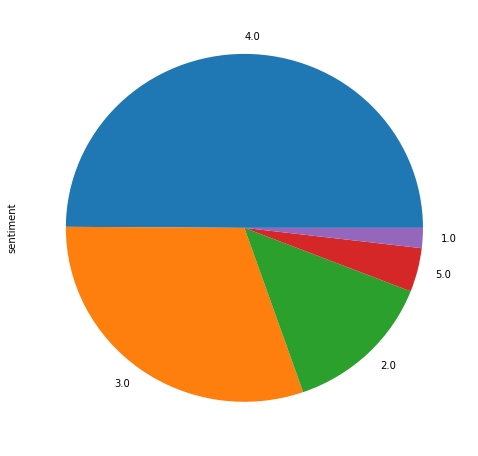

In [16]:
claritin.sentiment.value_counts().plot(kind='pie')

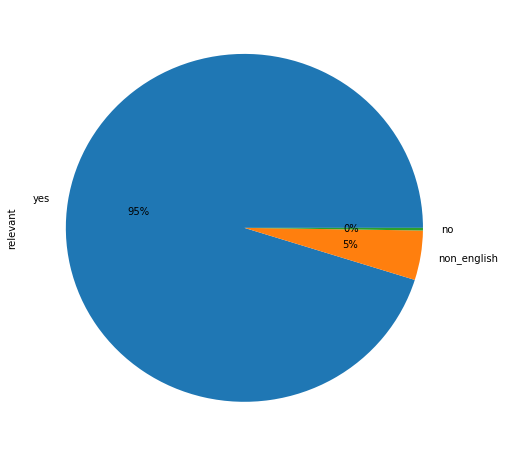

In [17]:
claritin.relevant.value_counts().plot(kind='pie', autopct='%1.0f%%')

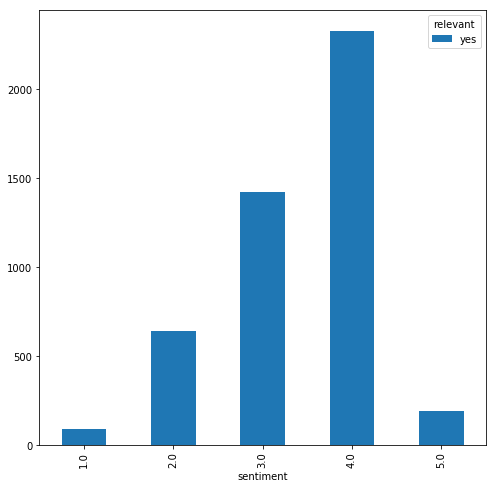

In [18]:
sentiment = claritin.groupby(['sentiment', 'relevant']).sentiment.count().unstack()
sentiment.plot(kind='bar')

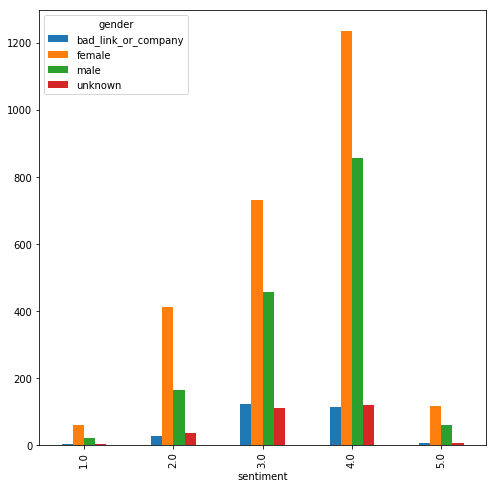

In [19]:
sex_sentiment = claritin.groupby(['sentiment', 'gender']).sentiment.count().unstack()
sex_sentiment.plot(kind='bar')

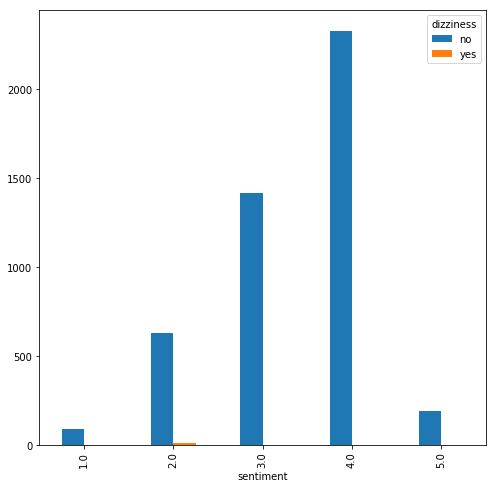

In [20]:
dizziness_sentiment = claritin.groupby(['sentiment', 'dizziness']).sentiment.count().unstack()
dizziness_sentiment.plot(kind='bar')

In [21]:
claritin['content_len'] = claritin['content'].str.split().apply(len)
claritin['content_len']

0       16
1       19
2       19
3       13
4       12
5       15
6       18
7       22
8       20
9        5
10      16
11      18
12       8
13       8
14       4
15       6
16       5
17      16
18      16
19      12
20      20
21      16
22      17
23      18
24      18
25      18
26      13
27      14
28      17
29      14
        ..
4870    13
4871     5
4872    23
4873    23
4874    24
4875    24
4876    19
4877    16
4878    16
4879    13
4880    11
4881     9
4882    11
4883     8
4884    17
4885    26
4886    15
4887    16
4888    13
4889    11
4890     9
4891    14
4892    24
4893     7
4894     5
4895     4
4896    15
4897    26
4898    12
4899     6
Name: content_len, Length: 4900, dtype: int64

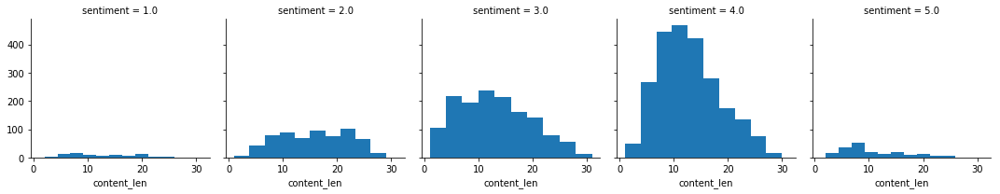

In [22]:
#Plot graph
g = sns.FacetGrid(data = claritin, col = 'sentiment')
g.map(plt.hist, 'content_len')

In [23]:
# Those graphs mean that more words have sentiment = 4 and following is sentiment = 3 which have second more words. 

C:\Users\mingming\Anaconda3\lib\site-packages\seaborn\categorical.py:462: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data)


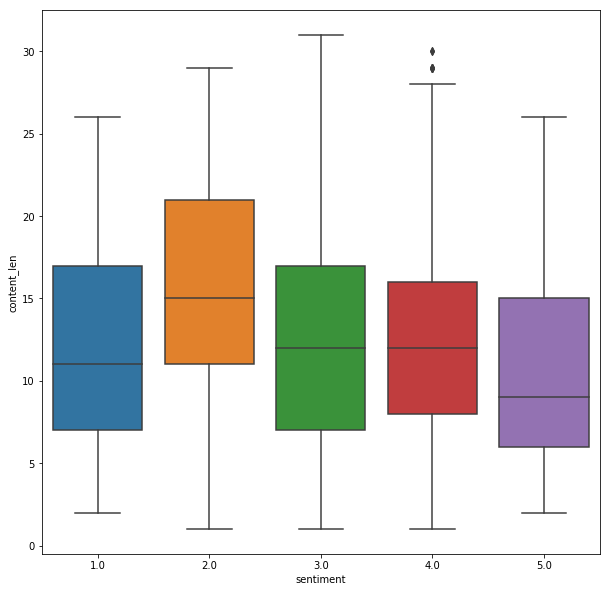

In [24]:
#Combining
plt.figure(figsize=(10,10))
sns.boxplot(x = 'sentiment', y = 'content_len', data = claritin)

In [25]:
# More content length of sentiment is 3 and 2.

In [26]:
## Convert yes and no to 1 and 0

claritin.dizziness.replace(('yes','no'),(1,0),inplace=True)
claritin.convulsions.replace(('yes','no'),(1,0), inplace=True)
claritin.heart_palpitations.replace(('yes','no'),(1,0), inplace = True)
claritin.headaches.replace(('yes','no'),(1.0,0),inplace = True)
claritin.drug_effect.replace(('yes','no'),(1,0),inplace = True)
claritin.allergies_after_drug.replace(('yes','no'),(1,0),inplace = True)
claritin.bad_interaction_bw.replace(('yes','no'),(1,0),inplace = True)
claritin.nausea.replace(('yes','no'),(1,0),inplace = True)
claritin.insomnia.replace(('yes','no'),(1,0),inplace = True)
claritin.shortness_of_breathe.replace(('yes','no'),(1,0),inplace = True)

In [27]:
claritin.head()

,id,article_url,content,time,relevant,sentiment,gender,dizziness,convulsions,heart_palpitations,shortness_of_breathe,headaches,drug_effect,allergies_after_drug,bad_interaction_bw,nausea,insomnia,content_len
0,1e216d4078b8ac80e074b6aefd0b8ecc,http://twitter.com/cm_haynes/statuses/25784942...,Is That Pollen or Profit in the Air? http://t....,"Mon, 15 Oct 2012 14:24:29 +0000",yes,3.0,female,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,16
1,1e21bdba2f09a600e07449388a202dd0,http://twitter.com/Gladisyrv/statuses/26016897...,Best payment to buy online dovonex no prescrip...,"Mon, 22 Oct 2012 00:01:32 +0000",yes,3.0,female,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,19
2,1e21e6045b94a680e074cc3af1e9826c,http://twitter.com/Gladisyrv/statuses/26133024...,Generic For _Pharmacy_. order atridox online w...,"Thu, 25 Oct 2012 04:56:01 +0000",yes,3.0,female,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,19
3,1e21ae673139a680e074c613e3dc017a,http://twitter.com/digifogcom/statuses/2597272...,buying Claritin without a prescription - buy C...,"Sat, 20 Oct 2012 18:46:25 +0000",yes,3.0,bad_link_or_company,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,13
4,1e218d1b517baf00e0740caa3005b42c,http://twitter.com/digifogcom/statuses/2587675...,order uk Claritin - Claritin and muscle cramps...,"Thu, 18 Oct 2012 03:12:54 +0000",yes,3.0,unknown,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,12


In [28]:
# create onlumn effect, if any side effect happy means 1
claritin['effect'] = np.where(claritin['dizziness'] + claritin['convulsions'] + claritin['heart_palpitations'] + claritin['drug_effect'] + claritin['allergies_after_drug'] + claritin['bad_interaction_bw'] + claritin['nausea']+ claritin['insomnia'] + claritin['shortness_of_breathe']  >=1,1,0)
claritin['effect']

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
       ..
4870    0
4871    0
4872    0
4873    0
4874    1
4875    0
4876    1
4877    0
4878    0
4879    0
4880    0
4881    0
4882    0
4883    0
4884    0
4885    0
4886    0
4887    1
4888    0
4889    0
4890    0
4891    0
4892    0
4893    0
4894    0
4895    0
4896    0
4897    0
4898    0
4899    0
Name: effect, Length: 4900, dtype: int32

In [29]:
claritin.groupby('sentiment').mean()

,dizziness,convulsions,heart_palpitations,shortness_of_breathe,drug_effect,allergies_after_drug,bad_interaction_bw,nausea,insomnia,content_len,effect
sentiment,,,,,,,,,,,
1.0,0.000000,0.0,0.00000,0.011494,0.080460,0.482759,0.000000,0.011494,0.022989,12.321839,0.574713
2.0,0.014063,0.0,0.00625,0.003125,0.084375,0.132812,0.021875,0.003125,0.025000,15.700000,0.281250
3.0,0.001409,0.0,0.00000,0.000000,0.000705,0.002114,0.010571,0.000705,0.003524,12.439042,0.019027
4.0,0.000000,0.0,0.00043,0.000430,0.001719,0.000859,0.004727,0.000000,0.000859,12.787280,0.009024
5.0,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005263,10.931579,0.005263


In [30]:
# Creating new data set with grouping based on sentiment
corr = claritin.corr()
corr

,sentiment,dizziness,convulsions,heart_palpitations,shortness_of_breathe,drug_effect,allergies_after_drug,bad_interaction_bw,nausea,insomnia,content_len,effect
sentiment,1.000000,-0.070690,NaN,-0.039139,-0.040223,-0.195746,-0.338722,-0.053128,-0.048922,-0.090822,-0.117809,-0.397577
dizziness,-0.070690,1.000000,NaN,0.133479,0.149574,-0.005827,-0.008300,-0.004523,-0.001425,-0.003641,0.044682,0.192757
convulsions,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
heart_palpitations,-0.039139,0.133479,NaN,1.000000,-0.000960,-0.003926,-0.005592,-0.003048,-0.000960,-0.002453,0.035741,0.129873
shortness_of_breathe,-0.040223,0.149574,NaN,-0.000960,1.000000,-0.003511,-0.005001,-0.002726,-0.000859,-0.002194,0.019983,0.116149
drug_effect,-0.195746,-0.005827,NaN,-0.003926,-0.003511,1.000000,0.034281,0.008541,-0.003511,-0.008972,0.038779,0.474972
allergies_after_drug,-0.338722,-0.008300,NaN,-0.005592,-0.005001,0.034281,1.000000,-0.015877,-0.005001,-0.012781,0.046324,0.676586
bad_interaction_bw,-0.053128,-0.004523,NaN,-0.003048,-0.002726,0.008541,-0.015877,1.000000,-0.002726,0.024264,0.087675,0.368724
nausea,-0.048922,-0.001425,NaN,-0.000960,-0.000859,-0.003511,-0.005001,-0.002726,1.000000,-0.002194,0.015285,0.116149
insomnia,-0.090822,-0.003641,NaN,-0.002453,-0.002194,-0.008972,-0.012781,0.024264,-0.002194,1.000000,0.052223,0.296826


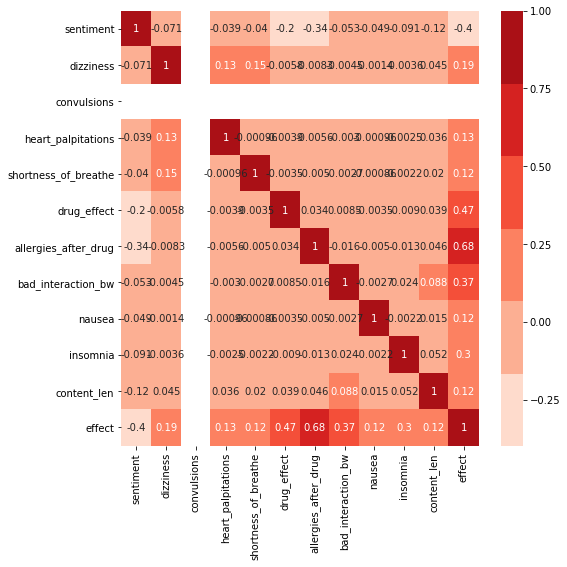

In [31]:
ax = sns.heatmap(corr, annot=True, cmap=sns.color_palette("Reds"))
plt.show()
#my_dpi = 96*2

In [32]:
### Summary for correlation: we know that the allergies_after_drug have negative effect on the setiment 
### and combine variable effec also have stronger negative effect on sentiment.

### Data Cleaning

In [33]:
claritin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4900 entries, 0 to 4899
Data columns (total 19 columns):
id                      4900 non-null object
article_url             4900 non-null object
content                 4900 non-null object
time                    4900 non-null object
relevant                4900 non-null object
sentiment               4663 non-null float64
gender                  4663 non-null object
dizziness               4663 non-null float64
convulsions             4663 non-null float64
heart_palpitations      4663 non-null float64
shortness_of_breathe    4663 non-null float64
headaches               4663 non-null object
drug_effect             4663 non-null float64
allergies_after_drug    4663 non-null float64
bad_interaction_bw      4663 non-null float64
nausea                  4663 non-null float64
insomnia                4663 non-null float64
content_len             4900 non-null int64
effect                  4900 non-null int32
dtypes: float64(10), int32(1),

In [34]:
features = claritin.iloc[:, 2].values
labels = claritin.iloc[:, 5].values

In [35]:
type(labels)

numpy.ndarray

In [36]:
### test the missing value on sentiment variable
claritin['sentiment'].isnull().sum()

237

### The step of NLP process


In [37]:
## Acount number of word
a = claritin['content'].str.lower().str.cat(sep=' ')
a

'is that pollen or profit in the air? http://t.co/9h6vzvsb\\none off-brand claritin per day for me :) best payment to buy online dovonex no prescription in the u.s.a. order dovonex online _pharmacy_ 鍋袒伿壽渝� claritin online... http://t.co/cpkoseal generic for _pharmacy_. order atridox online with cod, no rx needed for purchasing atridox. buy cheap claritin fast... http://t.co/tvue1vsu buying claritin without a prescription - buy claritin without prescription: image: http://t.co/nuq41cto... http://t.co/gx81ocnb order uk claritin - claritin and muscle cramps: image: http://t.co/1xgzmluf  (http://mysearcher... http://t.co/mallzzks best site to buy claritin at tesco: order claritin =buy online= order claritin (http://t.co/cs50gkmi... http://t.co/scedlffl acheter loratadine bon marche, achat loratadine 10 mg en france: acheter claritin === pharmacie === achat lorata... http://t.co/fgpnn7jp is there something you eat every day? 壽猒壽猒壽�题 i\'m not sure, but i find myself taking claritin pretty mu

In [38]:
## remove punctuation, number and returns list of word
b = re.sub('[^A-Za-z]+', ' ', a)
b

'is that pollen or profit in the air http t co h vzvsb none off brand claritin per day for me best payment to buy online dovonex no prescription in the u s a order dovonex online pharmacy claritin online http t co cpkoseal generic for pharmacy order atridox online with cod no rx needed for purchasing atridox buy cheap claritin fast http t co tvue vsu buying claritin without a prescription buy claritin without prescription image http t co nuq cto http t co gx ocnb order uk claritin claritin and muscle cramps image http t co xgzmluf http mysearcher http t co mallzzks best site to buy claritin at tesco order claritin buy online order claritin http t co cs gkmi http t co scedlffl acheter loratadine bon marche achat loratadine mg en france acheter claritin pharmacie achat lorata http t co fgpnn jp is there something you eat every day i m not sure but i find myself taking claritin pretty much everyday bec http t co buud kf photo new mi amor reserva beso from ashton cigars and generic clariti

In [39]:
# remove all the stopwords from the text 'is, an, preposition' in english language
stop_words = list(get_stop_words('en'))
nltk_words = list(stopwords.words('english'))
stop_words.extend(nltk_words)

In [40]:
nltk_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [41]:
# sentence or data can be split into word
word_tokens = word_tokenize(b)
word_tokens

['is',
 'that',
 'pollen',
 'or',
 'profit',
 'in',
 'the',
 'air',
 'http',
 't',
 'co',
 'h',
 'vzvsb',
 'none',
 'off',
 'brand',
 'claritin',
 'per',
 'day',
 'for',
 'me',
 'best',
 'payment',
 'to',
 'buy',
 'online',
 'dovonex',
 'no',
 'prescription',
 'in',
 'the',
 'u',
 's',
 'a',
 'order',
 'dovonex',
 'online',
 'pharmacy',
 'claritin',
 'online',
 'http',
 't',
 'co',
 'cpkoseal',
 'generic',
 'for',
 'pharmacy',
 'order',
 'atridox',
 'online',
 'with',
 'cod',
 'no',
 'rx',
 'needed',
 'for',
 'purchasing',
 'atridox',
 'buy',
 'cheap',
 'claritin',
 'fast',
 'http',
 't',
 'co',
 'tvue',
 'vsu',
 'buying',
 'claritin',
 'without',
 'a',
 'prescription',
 'buy',
 'claritin',
 'without',
 'prescription',
 'image',
 'http',
 't',
 'co',
 'nuq',
 'cto',
 'http',
 't',
 'co',
 'gx',
 'ocnb',
 'order',
 'uk',
 'claritin',
 'claritin',
 'and',
 'muscle',
 'cramps',
 'image',
 'http',
 't',
 'co',
 'xgzmluf',
 'http',
 'mysearcher',
 'http',
 't',
 'co',
 'mallzzks',
 'best',


In [42]:
# remove stop words from Data
filtered_sentence = []
for w in word_tokens:
    if w not in stop_words:
        filtered_sentence.append(w)
        
filtered_sentence        

['pollen',
 'profit',
 'air',
 'http',
 'co',
 'h',
 'vzvsb',
 'none',
 'brand',
 'claritin',
 'per',
 'day',
 'best',
 'payment',
 'buy',
 'online',
 'dovonex',
 'prescription',
 'u',
 'order',
 'dovonex',
 'online',
 'pharmacy',
 'claritin',
 'online',
 'http',
 'co',
 'cpkoseal',
 'generic',
 'pharmacy',
 'order',
 'atridox',
 'online',
 'cod',
 'rx',
 'needed',
 'purchasing',
 'atridox',
 'buy',
 'cheap',
 'claritin',
 'fast',
 'http',
 'co',
 'tvue',
 'vsu',
 'buying',
 'claritin',
 'without',
 'prescription',
 'buy',
 'claritin',
 'without',
 'prescription',
 'image',
 'http',
 'co',
 'nuq',
 'cto',
 'http',
 'co',
 'gx',
 'ocnb',
 'order',
 'uk',
 'claritin',
 'claritin',
 'muscle',
 'cramps',
 'image',
 'http',
 'co',
 'xgzmluf',
 'http',
 'mysearcher',
 'http',
 'co',
 'mallzzks',
 'best',
 'site',
 'buy',
 'claritin',
 'tesco',
 'order',
 'claritin',
 'buy',
 'online',
 'order',
 'claritin',
 'http',
 'co',
 'cs',
 'gkmi',
 'http',
 'co',
 'scedlffl',
 'acheter',
 'loratadine

In [43]:
# Remove characters which have length less than 2
without_single_cha = [word for word in filtered_sentence if len(word) >2 ]

# Remove number
without_numeric = [word for word in without_single_cha if not word.isnumeric()]


In [44]:
without_numeric

['pollen',
 'profit',
 'air',
 'http',
 'vzvsb',
 'none',
 'brand',
 'claritin',
 'per',
 'day',
 'best',
 'payment',
 'buy',
 'online',
 'dovonex',
 'prescription',
 'order',
 'dovonex',
 'online',
 'pharmacy',
 'claritin',
 'online',
 'http',
 'cpkoseal',
 'generic',
 'pharmacy',
 'order',
 'atridox',
 'online',
 'cod',
 'needed',
 'purchasing',
 'atridox',
 'buy',
 'cheap',
 'claritin',
 'fast',
 'http',
 'tvue',
 'vsu',
 'buying',
 'claritin',
 'without',
 'prescription',
 'buy',
 'claritin',
 'without',
 'prescription',
 'image',
 'http',
 'nuq',
 'cto',
 'http',
 'ocnb',
 'order',
 'claritin',
 'claritin',
 'muscle',
 'cramps',
 'image',
 'http',
 'xgzmluf',
 'http',
 'mysearcher',
 'http',
 'mallzzks',
 'best',
 'site',
 'buy',
 'claritin',
 'tesco',
 'order',
 'claritin',
 'buy',
 'online',
 'order',
 'claritin',
 'http',
 'gkmi',
 'http',
 'scedlffl',
 'acheter',
 'loratadine',
 'bon',
 'marche',
 'achat',
 'loratadine',
 'france',
 'acheter',
 'claritin',
 'pharmacie',
 'acha

C:\Users\mingming\Anaconda3\lib\site-packages\seaborn\categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


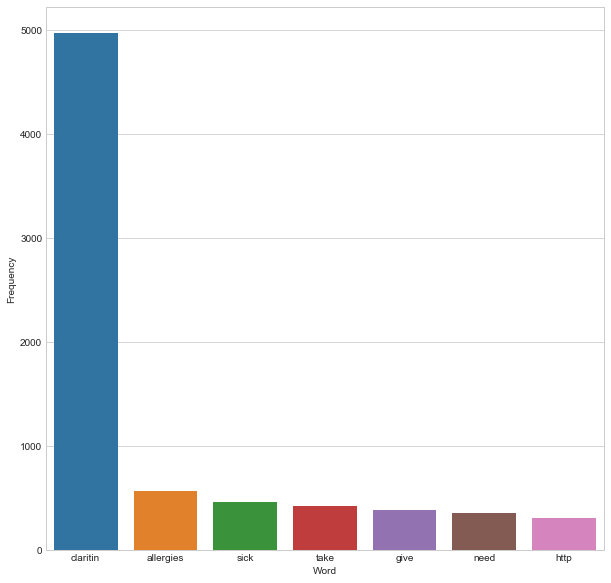

In [45]:
# Calculate frequency distribution
top = 100
word_list = nltk.FreqDist(without_numeric)
result = pd.DataFrame(word_list.most_common(top),
                     columns =['Word','Frequency'])

plt.figure(figsize =(10,10))
sns.set_style("whitegrid")
ax = sns.barplot(x = "Word", y="Frequency", data=result.head(7))

In [46]:
def wc(data,bgcolor,title):
    plt.figure(figsize = (100,100))
    wordcloud = WordCloud(background_color = bgcolor, max_words = 1000,  max_font_size = 50)
    # Generate a word cloud image
    wordcloud.generate(' '.join(data)) 
    # Display the generated image:
    # the matplotlib way:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')

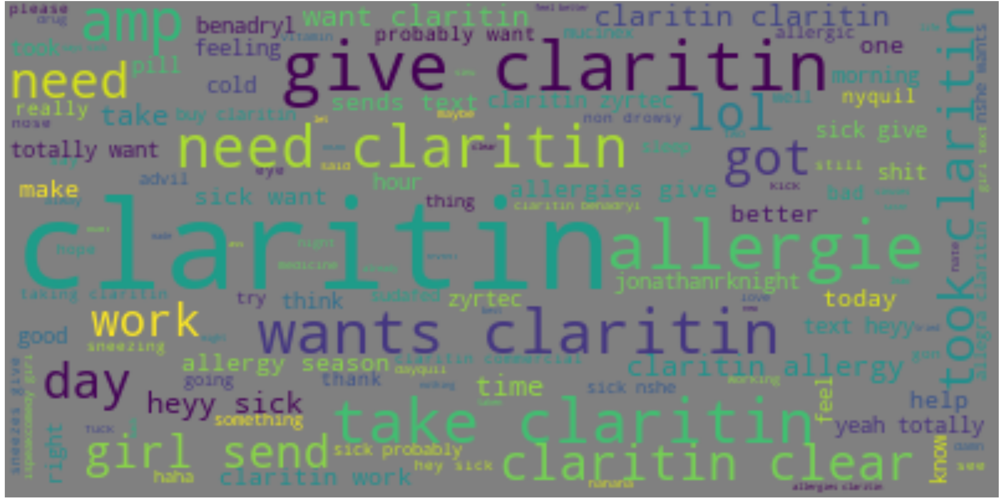

In [47]:
#Generating a square wordcloud from the word 
#jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000
wc(without_numeric,'grey','Most Used Words')

In [48]:
#create an empty list to store output of sentiment function of textblob
bloblist_desc = list()

df_review_str=claritin['content'].astype(str)

for row in df_review_str:
    blob = TextBlob(row)
    bloblist_desc.append((row, blob.sentiment.polarity, blob.sentiment.subjectivity))
    df_polarity_desc = pd.DataFrame(bloblist_desc, columns = ['Review','sentiment','polarity'])
 

df_polarity_desc.head(7)

,Review,sentiment,polarity
0,Is That Pollen or Profit in the Air? http://t....,0.5,1.000000
1,Best payment to buy online dovonex no prescrip...,1.0,0.300000
2,Generic For _Pharmacy_. order atridox online w...,0.2,0.433333
3,buying Claritin without a prescription - buy C...,0.0,0.000000
4,order uk Claritin - Claritin and muscle cramps...,0.0,0.000000
5,Best Site To Buy Claritin At Tesco: Order Clar...,1.0,0.300000
6,"Acheter Loratadine bon marche, achat Loratadin...",0.0,0.000000


In [49]:
#Defining a function which categorise comments based on polarity
def f(df_polarity_desc):
    if df_polarity_desc['sentiment'] > 0:
        val = "Positive Review"
    elif df_polarity_desc['sentiment'] == 0:
        val = "Neutral Review"
    else:
        val = "Negative Review"
    return val

In [50]:
#applying function to dataframe
df_polarity_desc['Sentiment_Type'] = df_polarity_desc.apply(f, axis=1)

In [51]:
df_polarity_desc.head(5)

,Review,sentiment,polarity,Sentiment_Type
0,Is That Pollen or Profit in the Air? http://t....,0.5,1.000000,Positive Review
1,Best payment to buy online dovonex no prescrip...,1.0,0.300000,Positive Review
2,Generic For _Pharmacy_. order atridox online w...,0.2,0.433333,Positive Review
3,buying Claritin without a prescription - buy C...,0.0,0.000000,Neutral Review
4,order uk Claritin - Claritin and muscle cramps...,0.0,0.000000,Neutral Review


C:\Users\mingming\Anaconda3\lib\site-packages\seaborn\categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


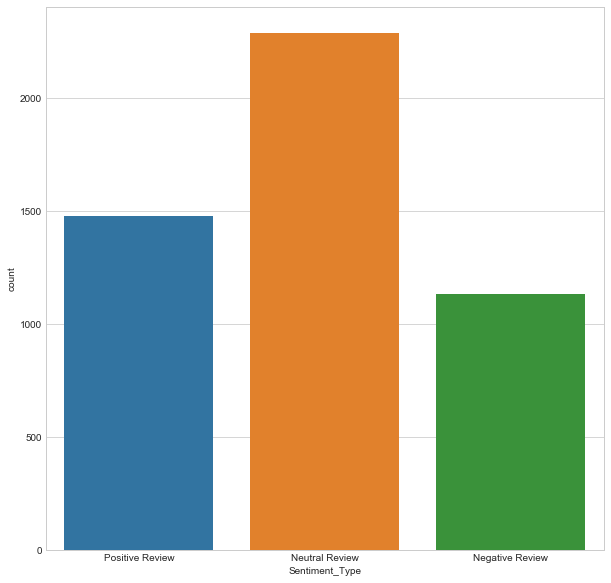

In [52]:
#Plotting count of Sentiment , +ve , neutral and -ve

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Type", data=df_polarity_desc)

In [53]:
positive_reviews=df_polarity_desc[df_polarity_desc['Sentiment_Type']=='Positive Review']
negative_reviews=df_polarity_desc[df_polarity_desc['Sentiment_Type']=='Negative Review']

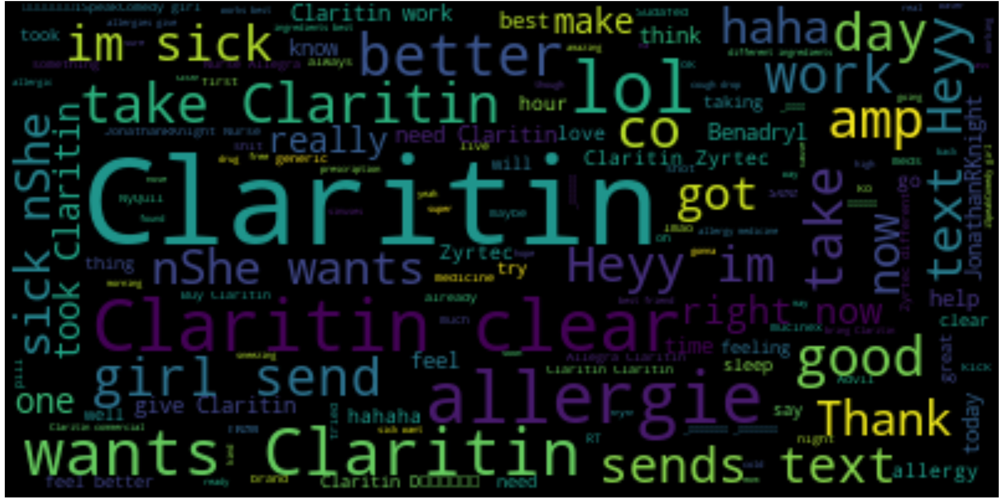

In [54]:

#word cloud of +ve
wc(positive_reviews['Review'],'black','Most Used Words')

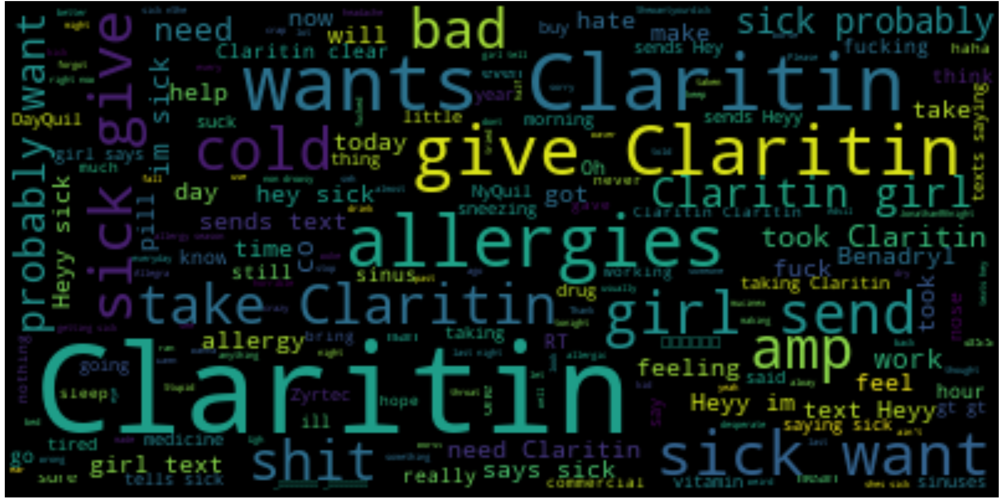

In [55]:
#world cloud of -ve
wc(negative_reviews['Review'],'black','Most Used Words')

In [ ]:
### clean claritin['content']


In [56]:
### Removing of Stop Words
from nltk.corpus import stopwords
stop = stopwords.words('english')
claritin['content_red'] = claritin['content'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
claritin['content_red'].head()

0    Is That Pollen Profit Air? http://t.co/9h6vZVs...
1    Best payment buy online dovonex prescription U...
2    Generic For _Pharmacy_. order atridox online c...
3    buying Claritin without prescription - buy Cla...
4    order uk Claritin - Claritin muscle cramps: Im...
Name: content_red, dtype: object

In [59]:
### Common word remove
freq = pd.Series(' '.join(claritin['content_red']).split()).value_counts()[:10]

freq = list(freq.index)
claritin['content_red'] = claritin['content_red'].apply(lambda x: " ".join(x for x in x.split() if x not in freq))
claritin['content_red'].head()

0    Is That Pollen Profit Air? http://t.co/9h6vZVs...
1    Best payment buy online dovonex prescription U...
2    Generic For _Pharmacy_. order atridox online c...
3    buying without prescription - buy without pres...
4    order uk - muscle cramps: Image: http://t.co/1...
Name: content_red, dtype: object

In [60]:
### Rare words removal
freq_rare = pd.Series(' '.join(claritin['content_red']).split()).value_counts()[-10:]
freq_rare = list(freq_rare.index)
claritin['content_red'] = claritin['content_red'].apply(lambda x: " ".join(x for x in x.split() if x not in freq))
claritin['content_red'].head()

0    Is That Pollen Profit Air? http://t.co/9h6vZVs...
1    Best payment buy online dovonex prescription U...
2    Generic For _Pharmacy_. order atridox online c...
3    buying without prescription - buy without pres...
4    order uk - muscle cramps: Image: http://t.co/1...
Name: content_red, dtype: object

In [61]:
### Stemming

from nltk.stem import PorterStemmer
st = PorterStemmer()
claritin['content_red'].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))


0       Is that pollen profit air? http://t.co/9h6vzvs...
1       best payment buy onlin dovonex prescript u.s.a...
2       gener for _pharmacy_. order atridox onlin cod,...
3       buy without prescript - buy without prescripti...
4       order uk - muscl cramps: image: http://t.co/1x...
5       best site To buy At tesco: order =buy online= ...
6       achet loratadin bon marche, achat loratadin 10...
7       Is someth eat everi day? 壽猒壽猒壽�题 sure, but fin...
8       photo: new Mi amor reserva beso #ashton #cigar...
9                      #claritin buy http://t.co/jmzvvybw
10      spookclub: yeah total want d. d, is. it壽猒壽猒蘝乢 ...
11      cv coupon deal 10/14-20: cheap鍋袒壽猒physician壽猒壽...
12        best buy buy onlin for cod http://t.co/jhmdatqa
13      best buy without A prescript ontario http://t....
14                             buy up http://t.co/rizhqdy
15       buy gener without prescript http://t.co/2apt45bz
16               purchas gener onlin http://t.co/pxnth99b
17      spookc

In [63]:
claritin['content_red'][:5]

0    Is That Pollen Profit Air? http://t.co/9h6vZVs...
1    Best payment buy online dovonex prescription U...
2    Generic For _Pharmacy_. order atridox online c...
3    buying without prescription - buy without pres...
4    order uk - muscle cramps: Image: http://t.co/1...
Name: content_red, dtype: object

In [64]:
### Lemmatization

from textblob import Word
claritin['content_red'] = claritin['content_red'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))

claritin.head()

,id,article_url,content,time,relevant,sentiment,gender,dizziness,convulsions,heart_palpitations,shortness_of_breathe,headaches,drug_effect,allergies_after_drug,bad_interaction_bw,nausea,insomnia,content_len,effect,content_red
0,1e216d4078b8ac80e074b6aefd0b8ecc,http://twitter.com/cm_haynes/statuses/25784942...,Is That Pollen or Profit in the Air? http://t....,"Mon, 15 Oct 2012 14:24:29 +0000",yes,3.0,female,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,16,0,Is That Pollen Profit Air? http://t.co/9h6vZVs...
1,1e21bdba2f09a600e07449388a202dd0,http://twitter.com/Gladisyrv/statuses/26016897...,Best payment to buy online dovonex no prescrip...,"Mon, 22 Oct 2012 00:01:32 +0000",yes,3.0,female,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,19,0,Best payment buy online dovonex prescription U...
2,1e21e6045b94a680e074cc3af1e9826c,http://twitter.com/Gladisyrv/statuses/26133024...,Generic For _Pharmacy_. order atridox online w...,"Thu, 25 Oct 2012 04:56:01 +0000",yes,3.0,female,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,19,0,Generic For _Pharmacy_. order atridox online c...
3,1e21ae673139a680e074c613e3dc017a,http://twitter.com/digifogcom/statuses/2597272...,buying Claritin without a prescription - buy C...,"Sat, 20 Oct 2012 18:46:25 +0000",yes,3.0,bad_link_or_company,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,13,0,buying without prescription - buy without pres...
4,1e218d1b517baf00e0740caa3005b42c,http://twitter.com/digifogcom/statuses/2587675...,order uk Claritin - Claritin and muscle cramps...,"Thu, 18 Oct 2012 03:12:54 +0000",yes,3.0,unknown,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,12,0,order uk - muscle cramps: Image: http://t.co/1...


In [65]:
### Drop the row if sentiment is NAN
claritin_sub = claritin.dropna(subset=['sentiment'])
#sentiment_class = claritin_sub[(claritin_sub['sentiment'] == 1) | (claritin_sub['sentiment'] == 5)]
#X_review=sentiment_class['content']
X_review = claritin_sub['content_red']
y=claritin_sub['sentiment']

In [66]:
claritin_sub.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4663 entries, 0 to 4899
Data columns (total 20 columns):
id                      4663 non-null object
article_url             4663 non-null object
content                 4663 non-null object
time                    4663 non-null object
relevant                4663 non-null object
sentiment               4663 non-null float64
gender                  4663 non-null object
dizziness               4663 non-null float64
convulsions             4663 non-null float64
heart_palpitations      4663 non-null float64
shortness_of_breathe    4663 non-null float64
headaches               4663 non-null object
drug_effect             4663 non-null float64
allergies_after_drug    4663 non-null float64
bad_interaction_bw      4663 non-null float64
nausea                  4663 non-null float64
insomnia                4663 non-null float64
content_len             4663 non-null int64
effect                  4663 non-null int32
content_red             4663 n

In [67]:
features = claritin_sub.iloc[:, 2].values
labels = claritin_sub.iloc[:, 5].values

In [68]:

from sklearn.feature_extraction.text import CountVectorizer
bow_transformer=CountVectorizer(stop_words=stopwords.words('english')).fit(X_review)

In [69]:
print(len(bow_transformer.vocabulary_))

7386


In [70]:
X_review = bow_transformer.transform(X_review)

In [71]:
X_review

<4663x7386 sparse matrix of type '<class 'numpy.int64'>'
	with 30575 stored elements in Compressed Sparse Row format>

In [127]:
y

0       3.0
1       3.0
2       3.0
3       3.0
4       3.0
5       3.0
7       4.0
9       3.0
10      4.0
11      3.0
12      3.0
13      3.0
14      3.0
15      3.0
16      3.0
17      4.0
18      4.0
19      4.0
20      3.0
21      3.0
22      3.0
23      3.0
24      3.0
25      3.0
26      3.0
27      3.0
28      3.0
29      3.0
30      3.0
31      3.0
       ... 
4870    2.0
4871    2.0
4872    4.0
4873    3.0
4874    2.0
4875    4.0
4876    3.0
4877    4.0
4878    3.0
4879    2.0
4880    3.0
4881    4.0
4882    3.0
4883    4.0
4884    4.0
4885    3.0
4886    1.0
4887    1.0
4888    4.0
4889    3.0
4890    4.0
4891    4.0
4892    4.0
4893    3.0
4894    3.0
4895    3.0
4896    4.0
4897    4.0
4898    4.0
4899    5.0
Name: sentiment, Length: 4663, dtype: float64

In [116]:
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(stop_words=stopwords.words('english'))
processed_array = vectorizer.fit_transform(features).toarray()

In [117]:
processed_array

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

### Dividing Data into Training and Test Sets

In [72]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_review, y, test_size=0.2, random_state=0)

### Training the Model

In [73]:
from sklearn.ensemble import RandomForestClassifier

text_classifier = RandomForestClassifier(n_estimators=200, random_state=0)
#text_classifier.fit(X_train, y_train)

In [74]:
text_classifier.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [75]:
predicted = text_classifier.predict(X_test)

In [76]:
from sklearn import metrics
print('Ramdom Forest Classifier', metrics.accuracy_score(y_test, predicted))

Ramdom Forest Classifier 0.5262593783494105


In [77]:
### Try another model multimomaiNB
from sklearn.naive_bayes import MultinomialNB

# Model Generation Using Multinomial Naive Bayes
clf = MultinomialNB().fit(X_train, y_train)
predicted= clf.predict(X_test)
print("MultinomialNB Accuracy:",metrics.accuracy_score(y_test, predicted))

MultinomialNB Accuracy: 0.5380493033226152


In [78]:
### Inorder to inprove the percetage of accuracy, I combine 4 and 5 as 4 and 1 nd 2 as 2
claritin_sub['sentiment_red']=np.where(claritin_sub['sentiment']==5, 4, claritin_sub['sentiment'])
claritin_sub['sentiment_red']=np.where(claritin_sub['sentiment']==1, 2, claritin_sub['sentiment_red'])

C:\Users\mingming\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\mingming\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


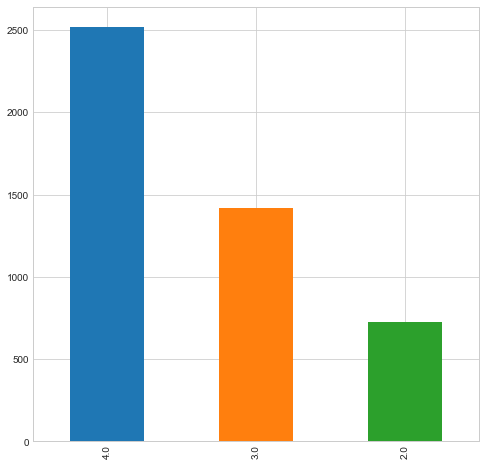

In [79]:
claritin_sub.sentiment_red.value_counts().plot('bar')

In [80]:
claritin_sub.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4663 entries, 0 to 4899
Data columns (total 21 columns):
id                      4663 non-null object
article_url             4663 non-null object
content                 4663 non-null object
time                    4663 non-null object
relevant                4663 non-null object
sentiment               4663 non-null float64
gender                  4663 non-null object
dizziness               4663 non-null float64
convulsions             4663 non-null float64
heart_palpitations      4663 non-null float64
shortness_of_breathe    4663 non-null float64
headaches               4663 non-null object
drug_effect             4663 non-null float64
allergies_after_drug    4663 non-null float64
bad_interaction_bw      4663 non-null float64
nausea                  4663 non-null float64
insomnia                4663 non-null float64
content_len             4663 non-null int64
effect                  4663 non-null int32
content_red             4663 n

In [81]:
y_red=claritin_sub['sentiment_red']
y_red

0       3.0
1       3.0
2       3.0
3       3.0
4       3.0
5       3.0
7       4.0
9       3.0
10      4.0
11      3.0
12      3.0
13      3.0
14      3.0
15      3.0
16      3.0
17      4.0
18      4.0
19      4.0
20      3.0
21      3.0
22      3.0
23      3.0
24      3.0
25      3.0
26      3.0
27      3.0
28      3.0
29      3.0
30      3.0
31      3.0
       ... 
4870    2.0
4871    2.0
4872    4.0
4873    3.0
4874    2.0
4875    4.0
4876    3.0
4877    4.0
4878    3.0
4879    2.0
4880    3.0
4881    4.0
4882    3.0
4883    4.0
4884    4.0
4885    3.0
4886    2.0
4887    2.0
4888    4.0
4889    3.0
4890    4.0
4891    4.0
4892    4.0
4893    3.0
4894    3.0
4895    3.0
4896    4.0
4897    4.0
4898    4.0
4899    4.0
Name: sentiment_red, Length: 4663, dtype: float64

In [82]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_review, y_red, test_size=0.2, random_state=0)

In [83]:
from sklearn.ensemble import RandomForestClassifier

text_classifier_red = RandomForestClassifier(n_estimators=200, random_state=0)
#text_classifier_red.fit(X_train, y_train)

In [84]:
text_classifier_red.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [85]:
print('Ramdom Forest Classifier for reduce sentiment', metrics.accuracy_score(y_test, predicted))

Ramdom Forest Classifier for reduce sentiment 0.5819935691318328
